In [2]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

In [20]:
data=pd.read_csv("ANZ synthesised transaction dataset.csv")

In [21]:
data.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,...,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,...,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,...,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,...,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,...,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 23 columns):
status               12043 non-null object
card_present_flag    7717 non-null float64
bpay_biller_code     885 non-null object
account              12043 non-null object
currency             12043 non-null object
long_lat             12043 non-null object
txn_description      12043 non-null object
merchant_id          7717 non-null object
merchant_code        883 non-null float64
first_name           12043 non-null object
balance              12043 non-null float64
date                 12043 non-null object
gender               12043 non-null object
age                  12043 non-null int64
merchant_suburb      7717 non-null object
merchant_state       7717 non-null object
extraction           12043 non-null object
amount               12043 non-null float64
transaction_id       12043 non-null object
country              12043 non-null object
customer_id          12043 non-null 

In [23]:
data.shape

(12043, 23)

### Checking for null values

In [7]:
data.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb       4326
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

In [8]:
data=data.drop(columns=['bpay_biller_code','merchant_code'],axis=1)

In [9]:
data.head()

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,Diana,35.39,8/1/2018,...,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,Diana,21.20,8/1/2018,...,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,Michael,5.71,8/1/2018,...,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,Rhonda,2117.22,8/1/2018,...,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,Diana,17.95,8/1/2018,...,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [10]:
data[data['status']=='posted']

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
5,posted,NaN,ACC-1608363396,AUD,151.22 -33.87,PAYMENT,NaN,Robert,1705.43,8/1/2018,...,20,NaN,NaN,2018-08-01T02:00:00.000+0000,163.0,1005b48a6eda4ffd85e9b649dc9467d3,Australia,CUS-2688605418,NaN,debit
9,posted,NaN,ACC-602667573,AUD,151.23 -33.96,INTER BANK,NaN,Michael,466.58,8/1/2018,...,40,NaN,NaN,2018-08-01T06:00:00.000+0000,21.0,798a77869014441b840a7a8a23408332,Australia,CUS-2031327464,NaN,debit
10,posted,NaN,ACC-2171593283,AUD,146.94 -36.04,PAYMENT,NaN,Fernando,4348.50,8/1/2018,...,19,NaN,NaN,2018-08-01T06:00:00.000+0000,27.0,baff17b27b2643c48c84fca7129e9611,Australia,CUS-2317998716,NaN,debit
11,posted,NaN,ACC-2776252858,AUD,144.95 -37.76,PAYMENT,NaN,Kristin,1203.75,8/1/2018,...,43,NaN,NaN,2018-08-01T06:00:00.000+0000,29.0,78a1b6c3a5534d48828d8ed266ba9c2e,Australia,CUS-4123612273,NaN,debit
13,posted,NaN,ACC-588564840,AUD,151.27 -33.76,INTER BANK,NaN,Isaiah,4438.16,8/1/2018,...,23,NaN,NaN,2018-08-01T07:00:00.000+0000,25.0,eaafa602902b4f4194efb96a105dd7ab,Australia,CUS-1462656821,NaN,debit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12027,posted,NaN,ACC-2173390920,AUD,144.71 -37.58,PHONE BANK,NaN,Luis,13537.75,10/31/2018,...,27,NaN,NaN,2018-10-31T21:00:00.000+0000,67.0,b2c42c27bb24464cb5e3e0ffbf9b1977,Australia,CUS-3180318393,NaN,debit
12032,posted,NaN,ACC-1710017148,AUD,150.82 -34.01,PAYMENT,NaN,Michelle,20699.90,10/31/2018,...,19,NaN,NaN,2018-10-31T22:00:00.000+0000,33.0,96fe9c5dcda24b599e81b6f6d5bdcb66,Australia,CUS-883482547,NaN,debit
12035,posted,NaN,ACC-1973887809,AUD,115.78 -31.90,PAYMENT,NaN,Antonio,9349.51,10/31/2018,...,26,NaN,NaN,2018-10-31T23:00:00.000+0000,29.0,dda53e538c5b4d5aae2481be22e60440,Australia,CUS-1646621553,NaN,debit
12036,posted,NaN,ACC-1349834573,AUD,145.17 -37.84,PAYMENT,NaN,Matthew,18127.50,10/31/2018,...,39,NaN,NaN,2018-10-31T23:00:00.000+0000,32.0,df15d6f039554dcbb3ca02631ce22068,Australia,CUS-1790886359,NaN,debit


In [11]:
data.shape

(12043, 21)

In [268]:
data.describe()

,card_present_flag,balance,age,amount
count,7717.000000,12043.000000,12043.000000,12043.000000
mean,0.802644,14704.195553,30.582330,187.933588
std,0.398029,31503.722652,10.046343,592.599934
min,0.000000,0.240000,18.000000,0.100000
25%,1.000000,3158.585000,22.000000,16.000000
50%,1.000000,6432.010000,28.000000,29.000000
75%,1.000000,12465.945000,38.000000,53.655000
max,1.000000,267128.520000,78.000000,8835.980000


In [269]:
data.country.value_counts()

Australia    12043
Name: country, dtype: int64

In [270]:
data.merchant_state.value_counts()

NSW    2169
VIC    2131
QLD    1556
WA     1100
SA      415
NT      205
ACT      73
TAS      68
Name: merchant_state, dtype: int64

In [25]:
data.age.value_counts()

26    893
38    767
20    765
21    733
24    732
40    704
19    693
34    537
25    515
30    499
43    473
35    444
27    443
18    442
28    414
22    399
23    309
39    283
37    276
31    255
42    232
44    160
46    153
33    139
29    134
41    121
47    110
69    102
64     88
52     77
53     73
50     44
78     34
Name: age, dtype: int64

In [28]:
# extract month name
data['date']=pd.to_datetime(data['date'])
data['month_name']=data['date'].dt.strftime('%B')

In [29]:
# extract weekdays
data['weekday']=data['date'].dt.strftime('%a')

In [30]:
# extract date from date column
data['date_of_trans']=data['date'].dt.day.astype(int)

In [275]:
data.head()

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement,month_name,weekday,date_of_trans
0,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,Diana,35.39,2018-08-01,...,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit,August,Wed,1
1,authorized,0.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,Diana,21.20,2018-08-01,...,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit,August,Wed,1
2,authorized,1.0,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,Michael,5.71,2018-08-01,...,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit,August,Wed,1
3,authorized,1.0,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,Rhonda,2117.22,2018-08-01,...,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit,August,Wed,1
4,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,Diana,17.95,2018-08-01,...,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit,August,Wed,1


# What is the average transaction amount?

In [276]:
data['amount'].mean()

187.93358797641767

# How many transaction do customers make each month on average?

In [277]:
data['customer_id'].nunique()

100

In [278]:
data.groupby([data['extraction'],'customer_id','first_name'])['transaction_id'].count()

extraction                    customer_id     first_name
2018-08-01T01:01:15.000+0000  CUS-2487424745  Diana         1
2018-08-01T01:13:45.000+0000  CUS-2487424745  Diana         1
2018-08-01T01:26:15.000+0000  CUS-2142601169  Michael       1
2018-08-01T01:38:45.000+0000  CUS-1614226872  Rhonda        1
2018-08-01T01:51:15.000+0000  CUS-2487424745  Diana         1
                                                           ..
2018-10-31T23:09:06.000+0000  CUS-55310383    Melissa       1
2018-10-31T23:21:46.000+0000  CUS-2688605418  Robert        1
2018-10-31T23:34:25.000+0000  CUS-2663907001  Craig         1
2018-10-31T23:47:05.000+0000  CUS-1388323263  Tyler         1
2018-10-31T23:59:44.000+0000  CUS-3129499595  Ryan          1
Name: transaction_id, Length: 12006, dtype: int64

In [279]:
data.groupby(['customer_id','extraction']).mean()

card_present_flag   balance  age  \
customer_id    extraction                                                       
CUS-1005756958 2018-08-02T08:08:02.000+0000                1.0    463.96   53   
               2018-08-02T21:36:42.000+0000                1.0    424.01   53   
               2018-08-03T08:27:40.000+0000                1.0    401.05   53   
               2018-08-03T09:15:59.000+0000                0.0    391.94   53   
               2018-08-03T21:51:32.000+0000                1.0    377.29   53   
...                                                        ...       ...  ...   
CUS-883482547  2018-10-29T12:46:31.000+0000                0.0  16835.50   19   
               2018-10-29T17:00:00.000+0000                NaN  20812.96   19   
               2018-10-29T20:24:35.000+0000                0.0  20786.90   19   
               2018-10-30T09:00:00.000+0000                NaN  20732.90   19   
               2018-10-31T22:00:00.000+0000                NaN  20699.90   19   

                                              amount  date_of_trans  
customer_id    extraction                                            
CUS-1005756958 2018-08-02T08:08:02.000+0000     6.48              2  
               2018-08-02T21:36:42.000+0000    39.95              2  
               2018-08-03T08:27:40.000+0000    22.96              3  
               2018-08-03T09:15:59.000+0000     9.11              3  
               2018-08-03T21:51:32.000+0000    14.65              3  
...                                              ...            ...  
CUS-883482547  2018-10-29T12:46:31.000+0000    10.92             29  
               2018-10-29T17:00:00.000+0000  3977.46             29  
               2018-10-29T20:24:35.000+0000    26.06             29  
               2018-10-30T09:00:00.000+0000    54.00             30  
               2018-10-31T22:00:00.000+0000    33.00             31  

[12006 rows x 5 columns]

In [280]:
data.extraction

0        2018-08-01T01:01:15.000+0000
1        2018-08-01T01:13:45.000+0000
2        2018-08-01T01:26:15.000+0000
3        2018-08-01T01:38:45.000+0000
4        2018-08-01T01:51:15.000+0000
                     ...             
12038    2018-10-31T23:09:06.000+0000
12039    2018-10-31T23:21:46.000+0000
12040    2018-10-31T23:34:25.000+0000
12041    2018-10-31T23:47:05.000+0000
12042    2018-10-31T23:59:44.000+0000
Name: extraction, Length: 12043, dtype: object

In [281]:
data.extraction=pd.to_datetime(data.extraction,infer_datetime_format=True)

In [282]:
data.extraction

0       2018-08-01 01:01:15+00:00
1       2018-08-01 01:13:45+00:00
2       2018-08-01 01:26:15+00:00
3       2018-08-01 01:38:45+00:00
4       2018-08-01 01:51:15+00:00
                   ...           
12038   2018-10-31 23:09:06+00:00
12039   2018-10-31 23:21:46+00:00
12040   2018-10-31 23:34:25+00:00
12041   2018-10-31 23:47:05+00:00
12042   2018-10-31 23:59:44+00:00
Name: extraction, Length: 12043, dtype: datetime64[ns, UTC]

In [283]:
data.groupby([data['extraction'].dt.strftime('%B'),'customer_id'])['amount'].mean()

extraction  customer_id   
August      CUS-1005756958    122.788000
            CUS-1117979751    202.402326
            CUS-1140341822    294.950667
            CUS-1147642491    305.363103
            CUS-1196156254    179.216220
                                 ...    
September   CUS-72755508      242.844615
            CUS-809013380     140.050714
            CUS-860700529      68.092247
            CUS-880898248     200.494706
            CUS-883482547     204.102414
Name: amount, Length: 300, dtype: float64

In [325]:
f=data.groupby([data['extraction'].dt.strftime('%B'),'customer_id','first_name'])['transaction_id'].count()

In [328]:
f.sort_values(ascending=False)[0:20]

extraction  customer_id     first_name
October     CUS-2487424745  Diana         206
August      CUS-2487424745  Diana         187
September   CUS-2487424745  Diana         185
August      CUS-3026014945  Tonya         111
October     CUS-2142601169  Michael       105
September   CUS-2142601169  Michael       104
October     CUS-3378712515  Kimberly      101
            CUS-3026014945  Tonya         100
September   CUS-1196156254  Jessica        98
            CUS-1614226872  Rhonda         97
August      CUS-2142601169  Michael        94
October     CUS-860700529   Jeffrey        91
September   CUS-2695611575  Joseph         90
            CUS-860700529   Jeffrey        89
October     CUS-51506836    Richard        88
August      CUS-1614226872  Rhonda         88
October     CUS-1669695324  Tiffany        85
August      CUS-3378712515  Kimberly       83
            CUS-1196156254  Jessica        82
September   CUS-3026014945  Tonya          81
Name: transaction_id, dtype: int64

In [327]:
df=data['customer_id'].value_counts()
df[0:10]

CUS-2487424745    578
CUS-2142601169    303
CUS-3026014945    292
CUS-3378712515    260
CUS-1614226872    259
CUS-1196156254    245
CUS-51506836      239
CUS-2695611575    239
CUS-860700529     233
CUS-1669695324    230
Name: customer_id, dtype: int64

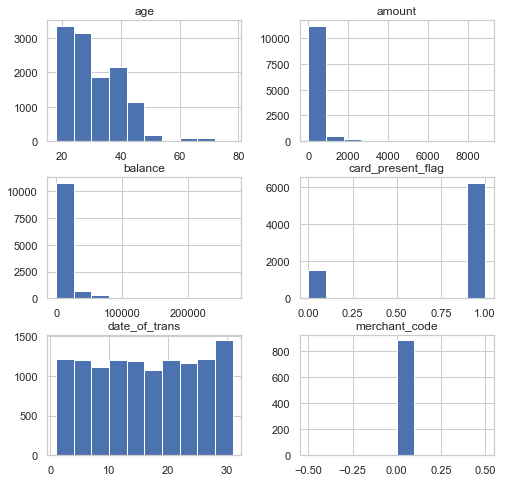

In [89]:
data.hist(figsize=(8,8))
plt.show()

In [88]:
data.date_of_trans.value_counts()

17    446
28    445
3     426
19    424
26    422
5     417
14    416
12    412
18    412
21    411
27    409
2     405
24    405
4     402
10    400
22    399
13    395
11    394
25    388
15    383
9     382
6     381
1     377
29    372
7     371
20    369
8     365
23    362
30    339
31    294
16    220
Name: date_of_trans, dtype: int64

In [31]:
#Understand the correlation
Correlation_Matrix=data.corr()

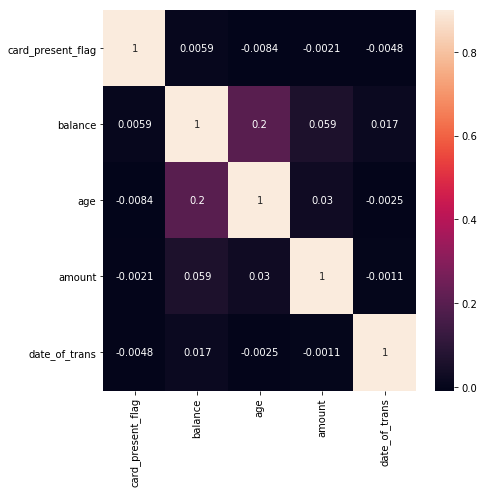

In [32]:
#Best way to see correlation is using Heatmap
fig=plt.figure(figsize=(7,7))
sns.heatmap(Correlation_Matrix,vmax=.9,annot=True)
plt.show()

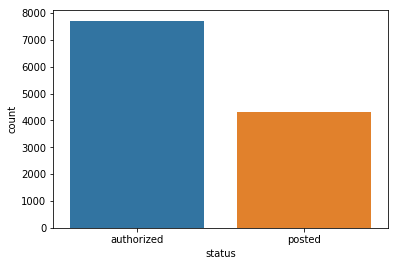

In [33]:
sns.countplot(data.status)
plt.show()

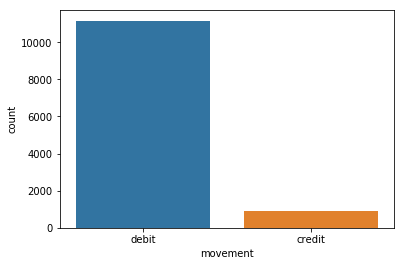

In [34]:
sns.countplot(data.movement)
plt.show()

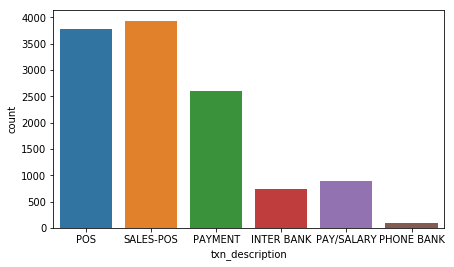

In [35]:
fig=plt.figure(figsize=(7,4))
sns.countplot(data.txn_description)
plt.show()

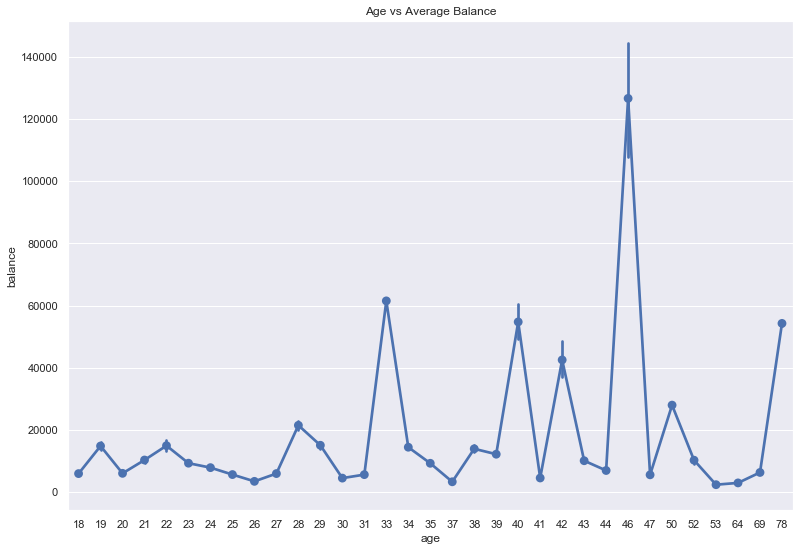

In [69]:
fig=plt.figure(figsize=(13,9))
sns.set(style="darkgrid")
sns.pointplot(x="age", 
 y="balance", 
 data=data,
 )
plt.title("Age vs Average Balance")
plt.show()

In [331]:
data[data['age']==46]['balance'].mean()

126729.08470588239

In [38]:
data[['first_name','account','balance','amount']].sort_values(by='balance',ascending=False)

,first_name,account,balance,amount
10467,Patrick,ACC-2014856841,267128.52,2179.96
10620,Patrick,ACC-2014856841,267093.66,34.86
10637,Patrick,ACC-2014856841,267050.66,43.00
10709,Patrick,ACC-2014856841,267028.97,21.69
10715,Patrick,ACC-2014856841,266981.30,47.67
...,...,...,...,...
237,Mackenzie,ACC-574997646,2.38,36.17
1361,Nathaniel,ACC-2681137560,1.02,6.02
5801,Michael,ACC-1222300524,0.98,5.47
837,Michael,ACC-1222300524,0.25,5.46


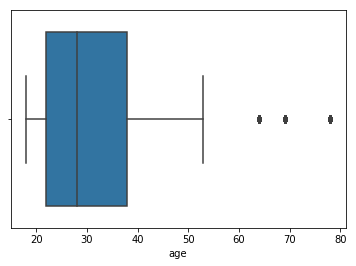

In [39]:
#Boxplot has to find outliers
sns.boxplot(data.age)
plt.show()

In [40]:
data.groupby(['date','customer_id','first_name'])['transaction_id'].count()

date        customer_id     first_name
2018-08-01  CUS-1117979751  Lucas         1
            CUS-1140341822  Dustin        1
            CUS-1196156254  Jessica       3
            CUS-1233833708  Michael       1
            CUS-1271030853  Michele       2
                                         ..
2018-10-31  CUS-537508723   Joseph        1
            CUS-55310383    Melissa       2
            CUS-72755508    Kimberly      1
            CUS-860700529   Jeffrey       1
            CUS-883482547   Michelle      1
Name: transaction_id, Length: 5521, dtype: int64

In [41]:
data.groupby(['date','customer_id','first_name'])['transaction_id'].count().idxmax()

(Timestamp('2018-09-14 00:00:00'), 'CUS-860700529', 'Jeffrey')

In [353]:
data[(data['customer_id']=='CUS-860700529') & (data['date']=='2018-09-14')]['transaction_id'].count()

20

In [42]:
data.groupby(['customer_id','first_name'])['transaction_id'].count().idxmax()

('CUS-2487424745', 'Diana')

In [43]:
data.groupby(['customer_id','first_name'])['transaction_id'].count().idxmin()

('CUS-1739931018', 'Kimberly')

In [44]:
data.groupby(['date','customer_id','first_name'])['transaction_id'].count().idxmin()

(Timestamp('2018-08-01 00:00:00'), 'CUS-1117979751', 'Lucas')

In [45]:
data[data.customer_id=='CUS-2487424745']

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement,month_name,weekday,date_of_trans
0,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,Diana,35.39,2018-08-01,...,2018-08-01 01:01:15+00:00,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit,August,Wed,1
1,authorized,0.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,Diana,21.20,2018-08-01,...,2018-08-01 01:13:45+00:00,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit,August,Wed,1
4,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,Diana,17.95,2018-08-01,...,2018-08-01 01:51:15+00:00,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit,August,Wed,1
20,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,POS,f2ef6270-cf91-409f-a6a2-fbd6735ea500,Diana,3.85,2018-08-01,...,2018-08-01 08:09:42+00:00,14.10,1c12c9ad77894ef8b507fb091e41e928,Australia,CUS-2487424745,153.6 -28.63,debit,August,Wed,1
72,posted,NaN,ACC-1598451071,AUD,153.41 -27.95,PAY/SALARY,NaN,Diana,1017.52,2018-08-01,...,2018-08-01 14:00:00+00:00,1013.67,a72c9dd8b4614a1982ff71f8b62677ad,Australia,CUS-2487424745,NaN,credit,August,Wed,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11990,authorized,0.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,e4758c3b-e8d8-49bd-990a-a823a86dcabc,Diana,2236.44,2018-10-31,...,2018-10-31 15:38:20+00:00,24.37,78fe3dcf051e47f88767ac7f4bb63f1b,Australia,CUS-2487424745,153.36 -28.07,debit,October,Wed,31
12013,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,a074e4af-d785-465d-a813-4701cc355c78,Diana,2220.14,2018-10-31,...,2018-10-31 18:42:46+00:00,16.30,db9aa7f3f1e44c6997376691b3d8d733,Australia,CUS-2487424745,153.02 -27.47,debit,October,Wed,31
12015,authorized,0.0,ACC-1598451071,AUD,153.41 -27.95,POS,e4758c3b-e8d8-49bd-990a-a823a86dcabc,Diana,2194.26,2018-10-31,...,2018-10-31 19:04:59+00:00,25.88,bb90a98fdcbd40a69ad40a4fcd3971f6,Australia,CUS-2487424745,153.36 -28.07,debit,October,Wed,31
12017,authorized,1.0,ACC-1598451071,AUD,153.41 -27.95,POS,f951df7c-92b7-444c-959b-e227f5bb6735,Diana,2148.06,2018-10-31,...,2018-10-31 19:31:18+00:00,46.20,362ee085d8794e1088f9906cde2aaa15,Australia,CUS-2487424745,151.05 -33.85,debit,October,Wed,31


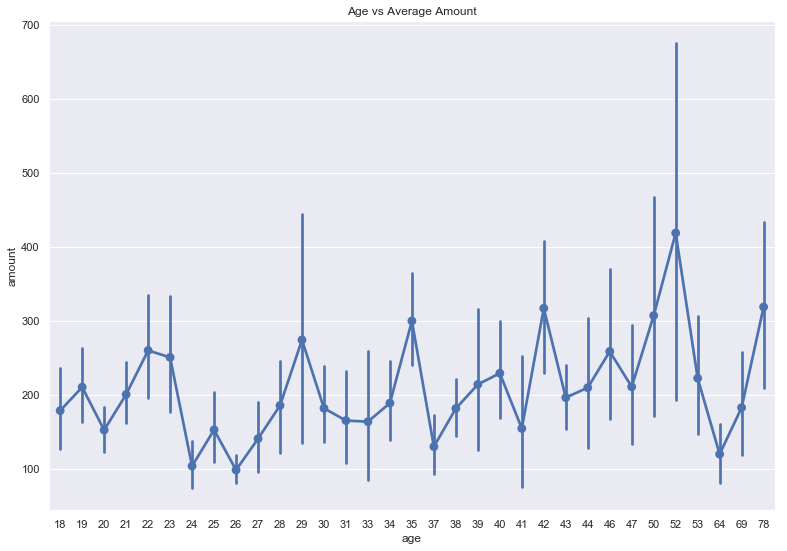

In [68]:
fig=plt.figure(figsize=(13,9))
sns.set(style="darkgrid")
sns.pointplot(x="age", 
 y="amount", 
 data=data,
 )
plt.title("Age vs Average Amount")
plt.show()

In [47]:
data[data['age']==52]

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement,month_name,weekday,date_of_trans
354,posted,NaN,ACC-1199531521,AUD,116.02 -31.87,PAY/SALARY,NaN,Billy,3801.41,2018-08-03,...,2018-08-03 13:00:00+00:00,3785.78,6b84057bbf1a4ade865af4902c7517d8,Australia,CUS-134833760,NaN,credit,August,Fri,3
467,authorized,1.0,ACC-1199531521,AUD,116.02 -31.87,POS,bdf4377a-77a8-4634-ae40-db1fd8128577,Billy,3795.10,2018-08-04,...,2018-08-04 07:34:04+00:00,6.31,c75343f5762447f2a4ac6928dc45e5d5,Australia,CUS-134833760,151.17 -33.9,debit,August,Sat,4
483,posted,NaN,ACC-1199531521,AUD,116.02 -31.87,INTER BANK,NaN,Billy,3712.10,2018-08-04,...,2018-08-04 11:00:00+00:00,83.00,a3f7f32671ac42dfadd49830fbd442b1,Australia,CUS-134833760,NaN,debit,August,Sat,4
602,authorized,1.0,ACC-1199531521,AUD,116.02 -31.87,POS,95acff5e-45de-453d-9fa3-fd055412b58c,Billy,3596.14,2018-08-05,...,2018-08-05 10:48:55+00:00,115.96,6fd5f396c1e94a4396122a82d1d2991a,Australia,CUS-134833760,115.86 -31.87,debit,August,Sun,5
616,posted,NaN,ACC-1199531521,AUD,116.02 -31.87,PAYMENT,NaN,Billy,3467.14,2018-08-05,...,2018-08-05 13:00:00+00:00,129.00,98e844d321b04dfa8585fc51c9090c1d,Australia,CUS-134833760,NaN,debit,August,Sun,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11341,posted,NaN,ACC-1199531521,AUD,116.02 -31.87,PAY/SALARY,NaN,Billy,20941.64,2018-10-26,...,2018-10-26 13:00:00+00:00,3785.78,f7fe613453934cf0b130c4f9c23ba55b,Australia,CUS-134833760,NaN,credit,October,Fri,26
11651,posted,NaN,ACC-1199531521,AUD,116.02 -31.87,PAYMENT,NaN,Billy,20848.64,2018-10-28,...,2018-10-28 17:00:00+00:00,93.00,04978f2ae27543e2b4970f3c5347633f,Australia,CUS-134833760,NaN,debit,October,Sun,28
11680,authorized,1.0,ACC-1199531521,AUD,116.02 -31.87,POS,1ea473e9-35af-4c45-997c-b4e15ebddec8,Billy,20811.08,2018-10-28,...,2018-10-28 20:34:52+00:00,37.56,79352b17eb4049b98cd230481173d774,Australia,CUS-134833760,115.77 -31.87,debit,October,Sun,28
11891,posted,NaN,ACC-1199531521,AUD,116.02 -31.87,PAYMENT,NaN,Billy,20791.08,2018-10-30,...,2018-10-30 20:00:00+00:00,20.00,08489cfe9fd1456cbc3fb80e61c388c3,Australia,CUS-134833760,NaN,debit,October,Tue,30


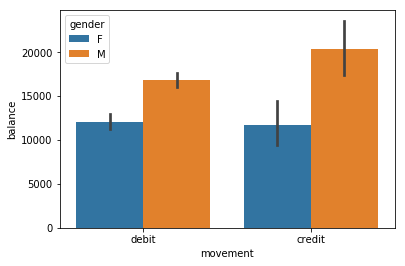

In [48]:
sns.barplot(x="movement",y="balance",data=data,hue="gender")
plt.show()

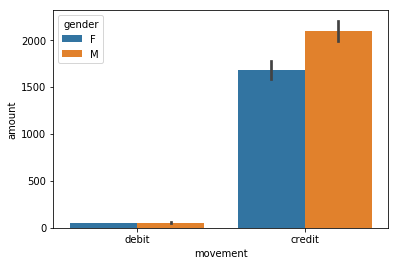

In [49]:
sns.barplot(x="movement",y="amount",data=data,hue="gender")
plt.show()

In [42]:
e=data.groupby(['merchant_long_lat'])['balance'].sum()
e.sort_values(ascending=False)[0:10]



merchant_long_lat
151.21 -33.87    1549470.38
144.97 -37.81    1117726.11
144.96 -37.82    1022899.58
144.96 -37.81     866814.56
151.18 -33.8      687361.32
144.94 -37.6      634616.12
144.83 -37.78     619222.48
145.13 -37.78     607166.04
145.27 -37.48     592120.89
151.2 -33.87      591651.76
Name: balance, dtype: float64

In [81]:
e=data.groupby(['merchant_long_lat'])['amount'].sum()
e.sort_values(ascending=False)[0:10]



merchant_long_lat
151.21 -33.87    12308.02
153.02 -27.48    11384.86
151.17 -33.94     9480.59
144.96 -37.82     6369.59
151.2 -33.87      4333.20
144.89 -37.77     3745.63
140.78 -37.83     3483.33
151.21 -33.86     3334.81
130.84 -12.44     3328.95
153.07 -27.53     2714.32
Name: amount, dtype: float64

In [368]:
data[(data['merchant_long_lat']=='145.09 -37.79') & (data['balance']==267093.66)]

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement,month_name,weekday,date_of_trans
10620,authorized,1.0,ACC-2014856841,AUD,144.99 -37.90,POS,d74f6467-029d-4ef5-9046-39db38104a5c,Patrick,267093.66,2018-10-20,...,2018-10-20 21:05:59+00:00,34.86,ec6a8341a9464bffacad6c2cb7532023,Australia,CUS-2370108457,145.09 -37.79,debit,October,Sat,20


In [359]:
data.balance.max()

267128.52

In [354]:
data.age.mean()

30.5823299842232

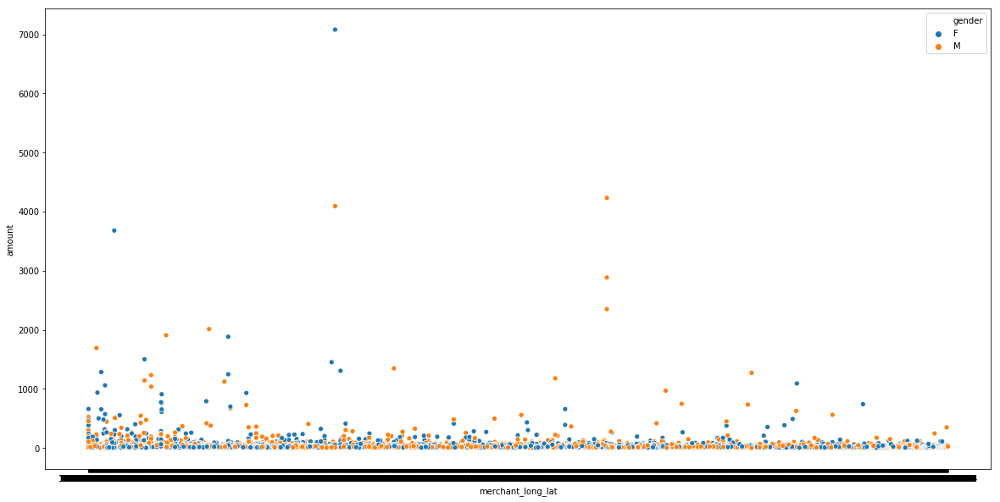

In [55]:
plt.figure(figsize=(20,10))
sns.scatterplot(x='merchant_long_lat',y='amount',hue='gender',data=data)
plt.show()

<Figure size 576x504 with 0 Axes>

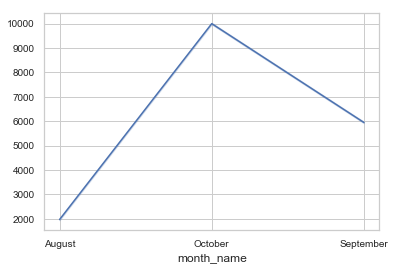

In [60]:
import random
plt.figure(figsize=(8,7))
fig, ax = plt.subplots()
sns.lineplot(x=data['month_name'],y = [i+random.gauss(0,1) for i,_ in enumerate(data['month_name'])])
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)
plt.show()

In [390]:
data['month_name'].value_counts()

October      4087
September    4013
August       3943
Name: month_name, dtype: int64

<Figure size 720x360 with 0 Axes>

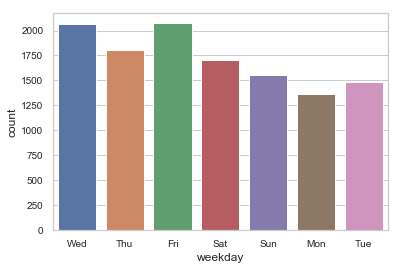

In [59]:
plt.figure(figsize=(10,5))
fig, ax = plt.subplots()
sns.countplot(x=data['weekday'])
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)
plt.show()

In [391]:
data['weekday'].value_counts()

Fri    2073
Wed    2063
Thu    1801
Sat    1709
Sun    1550
Tue    1487
Mon    1360
Name: weekday, dtype: int64

<Figure size 1296x720 with 0 Axes>

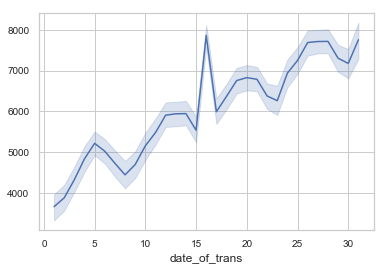

In [58]:
import random
plt.figure(figsize=(18,10))
fig, ax = plt.subplots()
sns.set(style="whitegrid")
sns.lineplot(x=data['date_of_trans'],y = [i+random.gauss(0,1) for i,_ in enumerate(data['date_of_trans'])])
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)
plt.show()

In [398]:
data['date_of_trans'].value_counts()

17    446
28    445
3     426
19    424
26    422
5     417
14    416
12    412
18    412
21    411
27    409
2     405
24    405
4     402
10    400
22    399
13    395
11    394
25    388
15    383
9     382
6     381
1     377
29    372
7     371
20    369
8     365
23    362
30    339
31    294
16    220
Name: date_of_trans, dtype: int64

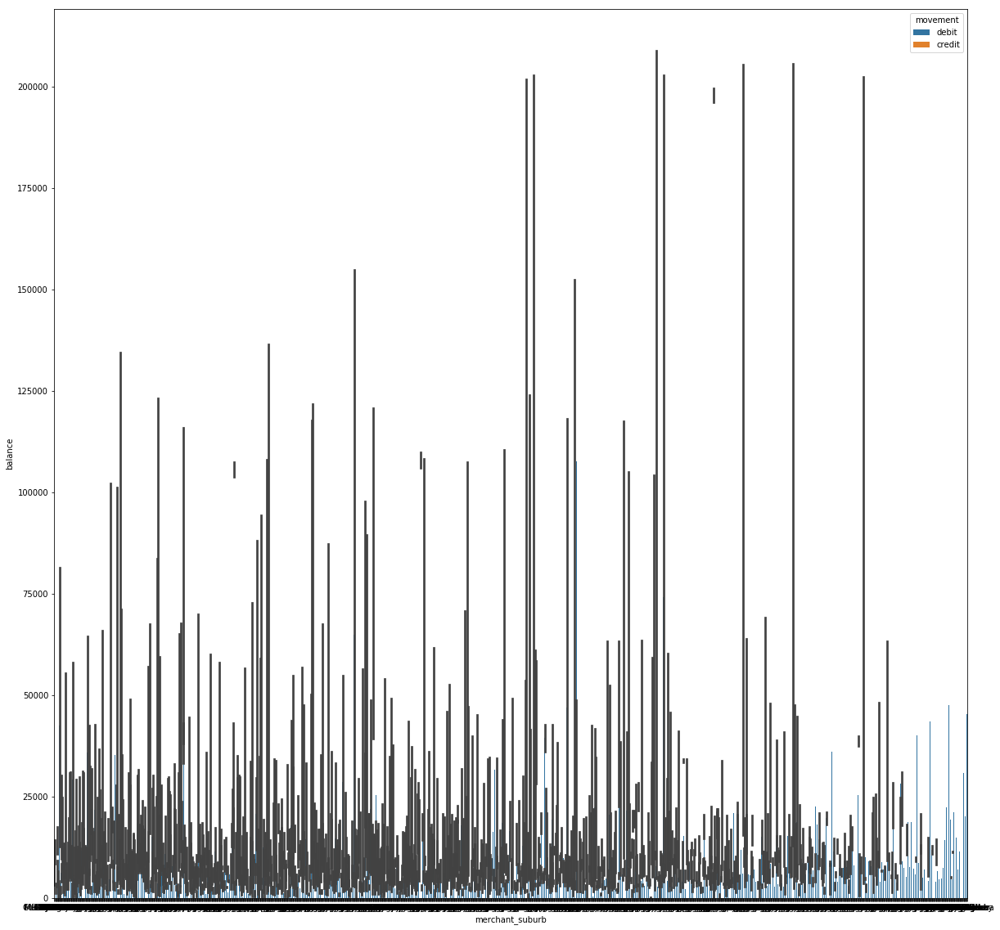

In [63]:
plt.figure(figsize=(20,20))
sns.barplot(x="merchant_suburb",y="balance",data=data,hue="movement")
plt.show()

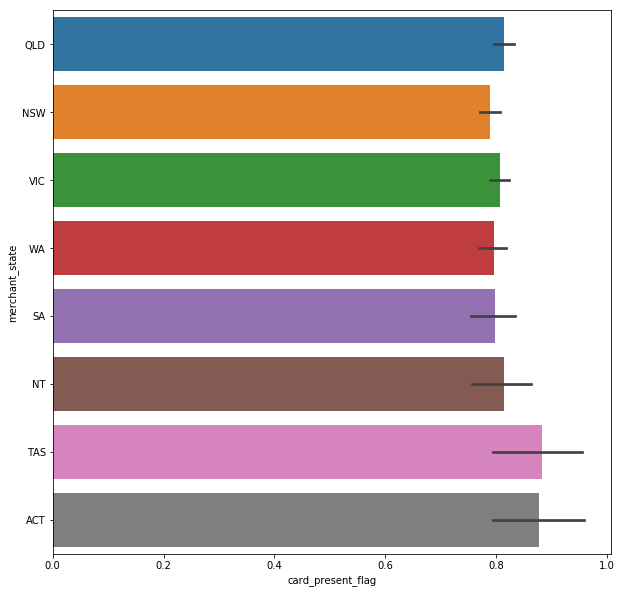

In [145]:
plt.figure(figsize=(10,10))
sns.barplot(x='card_present_flag',data=data,y='merchant_state')
plt.show()

In [410]:
data.status_n.value_counts()

1    7717
0    4326
Name: status_n, dtype: int64

In [428]:
data.groupby(['merchant_state','status'])['status'].count()

merchant_state  status    
ACT             authorized      73
NSW             authorized    2169
NT              authorized     205
QLD             authorized    1556
SA              authorized     415
TAS             authorized      68
VIC             authorized    2131
WA              authorized    1100
Name: status, dtype: int64

In [142]:
data.sort_values(by="balance")

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement,month_name,weekday,date_of_trans
792,authorized,1.0,ACC-1217063613,AUD,147.61 -37.82,POS,a39e17e7-8ca2-4a62-8ad7-6e7c841fc579,Kimberly,0.24,2018-08-07,...,2018-08-07T09:25:17.000+0000,14.73,38a2377f941d4504a96a8d6541d897d6,Australia,CUS-1739931018,144.41 -38.02,debit,August,Tue,7
837,authorized,1.0,ACC-1222300524,AUD,151.23 -33.94,POS,f6d24b03-5ca8-4cb3-83e2-73db22103a8a,Michael,0.25,2018-08-07,...,2018-08-07T15:34:37.000+0000,5.46,34055a1bc26942a69ee70eab55d29cd5,Australia,CUS-2142601169,145.25 -37.91,debit,August,Tue,7
5801,authorized,1.0,ACC-1222300524,AUD,151.23 -33.94,SALES-POS,a1ca1b7e-a737-4fc8-b070-3e606f52c0d6,Michael,0.98,2018-09-14,...,2018-09-14T20:08:54.000+0000,5.47,2fc1fc588217444aa9c03a070f94512c,Australia,CUS-2142601169,115.07 -33.95,debit,September,Fri,14
1361,authorized,1.0,ACC-2681137560,AUD,151.11 -33.99,POS,1965f16b-c400-4611-8367-28a7203711cd,Nathaniel,1.02,2018-08-11,...,2018-08-11T11:56:49.000+0000,6.02,87f022d08ad448e0ad1668e6bd1241c4,Australia,CUS-2083971310,151.09 -33.83,debit,August,Sat,11
237,authorized,1.0,ACC-574997646,AUD,150.79 -33.64,POS,e118ada1-248d-407c-8e8c-553cbc134cfd,Mackenzie,2.38,2018-08-02,...,2018-08-02T16:23:36.000+0000,36.17,cb538f413d8e42e48b75188da75f8706,Australia,CUS-586638664,151.06 -33.92,debit,August,Thu,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10715,authorized,1.0,ACC-2014856841,AUD,144.99 -37.90,POS,37ef33f1-3421-43ca-941f-38ddfbfe61d2,Patrick,266981.30,2018-10-21,...,2018-10-21T15:19:07.000+0000,47.67,0ffb3be1e1c3479ea008836af0e0c64d,Australia,CUS-2370108457,144.96 -37.82,debit,October,Sun,21
10709,authorized,1.0,ACC-2014856841,AUD,144.99 -37.90,SALES-POS,8b13dcb3-04e0-43aa-b3f2-f8f452d06c2d,Patrick,267028.97,2018-10-21,...,2018-10-21T14:33:13.000+0000,21.69,bf40d52ea2a940a1bc2c529bced62b71,Australia,CUS-2370108457,144.83 -37.78,debit,October,Sun,21
10637,posted,NaN,ACC-2014856841,AUD,144.99 -37.90,PAYMENT,NaN,Patrick,267050.66,2018-10-20,...,2018-10-20T23:00:00.000+0000,43.00,782a6d26da574671a5b09aefb38bc3c3,Australia,CUS-2370108457,NaN,debit,October,Sat,20
10620,authorized,1.0,ACC-2014856841,AUD,144.99 -37.90,POS,d74f6467-029d-4ef5-9046-39db38104a5c,Patrick,267093.66,2018-10-20,...,2018-10-20T21:05:59.000+0000,34.86,ec6a8341a9464bffacad6c2cb7532023,Australia,CUS-2370108457,145.09 -37.79,debit,October,Sat,20


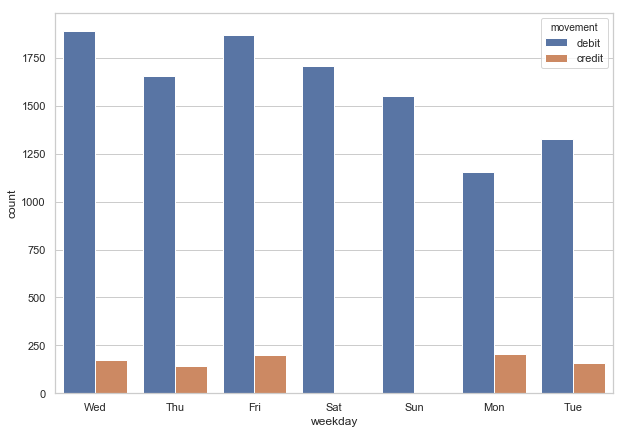

In [71]:
plt.figure(figsize=(10,7))
sns.set(style="whitegrid")
sns.countplot(x=data["weekday"],hue="movement",data=data)
plt.show()

In [31]:
import plotly.express as px
plt.figure(figsize=(10,10))
fig = px.box(data, x="date_of_trans", y="account")
fig.show()

<Figure size 720x720 with 0 Axes>

In [479]:
data.account.nunique()

100

In [119]:
fig = px.box(data, x="weekday", y="account", color="gender")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [120]:
import plotly.express as px

fig = px.box(data, x="weekday", y="age", color="status")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [121]:
import plotly.express as px

fig = px.box(data, x="weekday", y="txn_description", color="status")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

<Figure size 1440x1440 with 0 Axes>

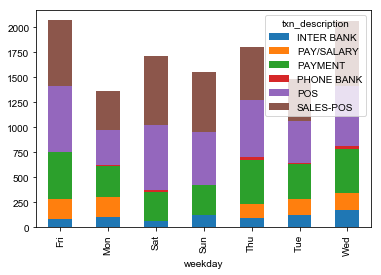

In [518]:
plt.figure(figsize=(20,20))
pd.crosstab(data['weekday'], data['txn_description']).plot(kind='bar', stacked=True)
sns.set(style="whitegrid")

In [122]:
import plotly.express as px

fig = px.box(data, x="weekday", y="txn_description", color="gender")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

<Figure size 1440x1440 with 0 Axes>

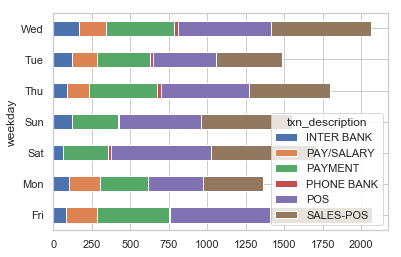

In [528]:
plt.figure(figsize=(20,20))
pd.crosstab(data['weekday'], data['txn_description']).plot(kind='barh', stacked=True)
sns.set(style="whitegrid")

In [124]:
fig = px.pie(data, values='balance', names='txn_description')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [125]:
fig = px.pie(data, values='age', names='txn_description')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [130]:
fig = px.pie(data, values='amount', names='status')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [131]:
fig = px.pie(data, values='amount', names='movement')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [132]:
fig = px.pie(data, values='balance', names='merchant_state')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [33]:
data.groupby(['merchant_state'])['balance'].sum().sort_values(ascending=False)

merchant_state
VIC    41881071.72
NSW    20493615.96
QLD    11035157.51
WA     10746485.22
SA      4627386.99
NT      1136194.09
ACT      911719.22
TAS      777312.96
Name: balance, dtype: float64

In [529]:
fig = px.pie(data, values='amount', names='merchant_state')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [34]:
data.groupby(['merchant_state'])['amount'].sum().sort_values(ascending=False)

merchant_state
NSW    102021.77
VIC     87584.00
QLD     53483.45
WA      33992.06
SA      16776.57
NT       9168.89
ACT      4876.68
TAS      1962.93
Name: amount, dtype: float64

In [202]:
fig = px.pie(data, values='amount', names='customer_id')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [79]:
fig = px.pie(data, values='balance', names='customer_id')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [533]:
data.groupby(['customer_id'])['amount'].sum().sort_values()

customer_id
CUS-1233833708    10385.54
CUS-1654129794    10587.42
CUS-1739931018    10652.72
CUS-1646183815    10845.25
CUS-72755508      11438.37
                    ...   
CUS-261674136     36786.13
CUS-2155701614    37943.79
CUS-1816693151    40215.54
CUS-3142625864    42688.30
CUS-2738291516    45409.16
Name: amount, Length: 100, dtype: float64

In [140]:
import plotly.express as px
fig = px.box(data, x="month_name", y="merchant_suburb", points="all")
fig.show()

In [181]:
#Top 10 customers with most number of transactions
c=data.groupby(['customer_id','first_name'])['transaction_id'].count()

In [182]:
c.sort_values(ascending=False)[0:10]

customer_id     first_name
CUS-2487424745  Diana         578
CUS-2142601169  Michael       303
CUS-3026014945  Tonya         292
CUS-3378712515  Kimberly      260
CUS-1614226872  Rhonda        259
CUS-1196156254  Jessica       245
CUS-2695611575  Joseph        239
CUS-51506836    Richard       239
CUS-860700529   Jeffrey       233
CUS-1669695324  Tiffany       230
Name: transaction_id, dtype: int64

In [84]:
#Top 10 customers spending the most amount
d=data.groupby(['customer_id','first_name'])['balance'].sum()

In [85]:
d.sort_values(ascending=False)[0:10]

customer_id     first_name 
CUS-527400765   Natasha        29983336.71
CUS-2370108457  Patrick        17671502.33
CUS-3117610635  Christopher     8547297.74
CUS-2819545904  Brian           7011950.25
CUS-2663907001  Craig           6505599.14
CUS-1196156254  Jessica         5456746.27
CUS-1816693151  Tim             5102791.53
CUS-1609060617  Michael         4591549.46
CUS-2059096722  Michael         4226400.33
CUS-3462882033  Michael         3985131.11
Name: balance, dtype: float64

In [209]:
data[data['customer_id']=='CUS-2738291516']

,status,card_present_flag,account,currency,long_lat,txn_description,merchant_id,first_name,balance,date,...,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement,month_name,weekday,date_of_trans
271,authorized,0.0,ACC-3317636250,AUD,153.02 -27.66,POS,e3e28ad9-50a4-4a33-b675-bb611d49b517,Kenneth,147.58,2018-08-02,...,2018-08-02T21:14:43.000+0000,42.94,46057999ca3d45b98dc5fa7442a43708,Australia,CUS-2738291516,114.17 -27.7,debit,August,Thu,2
273,authorized,1.0,ACC-3317636250,AUD,153.02 -27.66,SALES-POS,c650b4d8-848b-411a-a56e-70a914fbba7c,Kenneth,119.37,2018-08-02,...,2018-08-02T21:47:41.000+0000,28.21,bd9b4e94145f4f47bdd7f9fe8af40376,Australia,CUS-2738291516,153.14 -27.67,debit,August,Thu,2
301,authorized,1.0,ACC-3317636250,AUD,153.02 -27.66,POS,2c947b40-d708-44b7-9ec0-1889e016aeac,Kenneth,100.86,2018-08-03,...,2018-08-03T04:39:08.000+0000,18.51,0753aa9b6f324a07a779e5133f19faa7,Australia,CUS-2738291516,152.96 -27.08,debit,August,Fri,3
393,posted,NaN,ACC-3317636250,AUD,153.02 -27.66,PAY/SALARY,NaN,Kenneth,2645.62,2018-08-03,...,2018-08-03T17:00:00.000+0000,2544.76,37f6f831162547ed87e15e8c8c60d61e,Australia,CUS-2738291516,NaN,credit,August,Fri,3
429,authorized,1.0,ACC-3317636250,AUD,153.02 -27.66,SALES-POS,abf31fa7-2b8d-421b-85ca-1c81a4a04b64,Kenneth,2620.47,2018-08-03,...,2018-08-03T21:14:43.000+0000,25.15,7e82849423a2434caba02925c91e8324,Australia,CUS-2738291516,151.2 -33.87,debit,August,Fri,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11378,posted,NaN,ACC-3317636250,AUD,153.02 -27.66,PAY/SALARY,NaN,Kenneth,21121.09,2018-10-26,...,2018-10-26T17:00:00.000+0000,2544.76,b9d4f1eb054c4e51a4699ebae6e3d925,Australia,CUS-2738291516,NaN,credit,October,Fri,26
11595,posted,NaN,ACC-3317636250,AUD,153.02 -27.66,PAYMENT,NaN,Kenneth,21028.09,2018-10-28,...,2018-10-28T08:00:00.000+0000,93.00,a70a9d9de79f43809f6947a5bb4984de,Australia,CUS-2738291516,NaN,debit,October,Sun,28
11647,authorized,0.0,ACC-3317636250,AUD,153.02 -27.66,SALES-POS,cfce0f5c-07c5-40fd-ac84-d8b1d701e12b,Kenneth,21003.70,2018-10-28,...,2018-10-28T16:10:39.000+0000,24.39,0bb3ca7540f2474094f65e295d044d2b,Australia,CUS-2738291516,152.97 -27.5,debit,October,Sun,28
11790,authorized,0.0,ACC-3317636250,AUD,153.02 -27.66,SALES-POS,37e9c950-5136-4f86-9e9b-1ded5c0c8d5c,Kenneth,20954.58,2018-10-29,...,2018-10-29T19:29:17.000+0000,49.12,9c3b65c1d6b24e518e9d9d92012a4bc5,Australia,CUS-2738291516,117.89 -27.43,debit,October,Mon,29


In [80]:
#Top 10 customers spending the most amount
d=data.groupby(['account','first_name'])['amount'].sum()
d.sort_values(ascending=False)[0:10]

account         first_name
ACC-3317636250  Kenneth       45409.16
ACC-1496451953  Ricky         42688.30
ACC-1523339231  Tim           40215.54
ACC-2231965366  Linda         37943.79
ACC-240804743   Kenneth       36786.13
ACC-1710017148  Michelle      36639.41
ACC-958000567   Sandra        36588.25
ACC-3879258709  Natasha       36543.61
ACC-3485804958  Jessica       36050.72
ACC-602667573   Michael       35832.97
Name: amount, dtype: float64

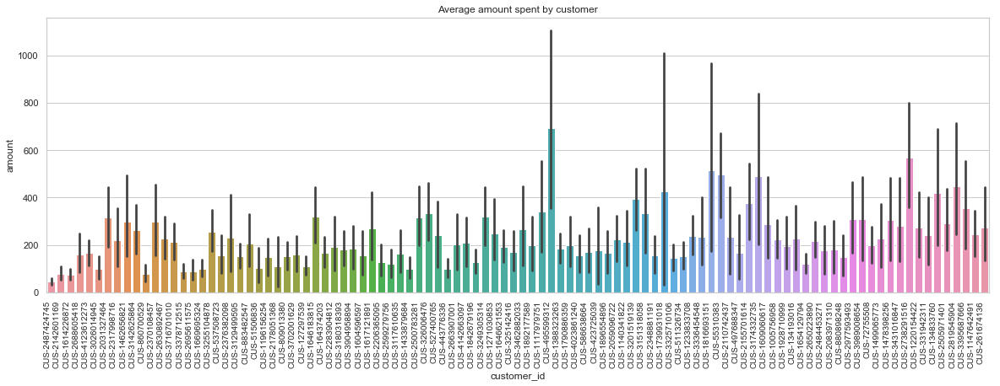

In [536]:
plt.figure(figsize=(20,6))
ax = sns.barplot(x='customer_id', y='amount', data=data);
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right",fontsize=10);
plt.title("Average amount spent by customer");

In [538]:
data.groupby(['customer_id'])['amount'].mean().sort_values(ascending=False)

customer_id
CUS-495599312     693.632903
CUS-2738291516    567.614500
CUS-1816693151    515.583846
CUS-55310383      497.669474
CUS-3174332735    489.220980
                     ...    
CUS-3378712515     87.546000
CUS-2142601169     78.206106
CUS-860700529      77.681888
CUS-1614226872     74.465019
CUS-2487424745     45.348772
Name: amount, Length: 100, dtype: float64

In [12]:
data['Group_Age'] = np.where(data['age']<=37,1, (np.where( data['age']<=57, 2, 3)))

<Figure size 1080x360 with 0 Axes>

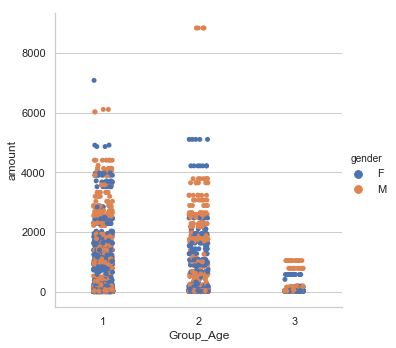

In [547]:
plt.figure(figsize=(15,5))
sns.catplot(x='Group_Age',y='amount',hue='gender',data=data)
plt.show()

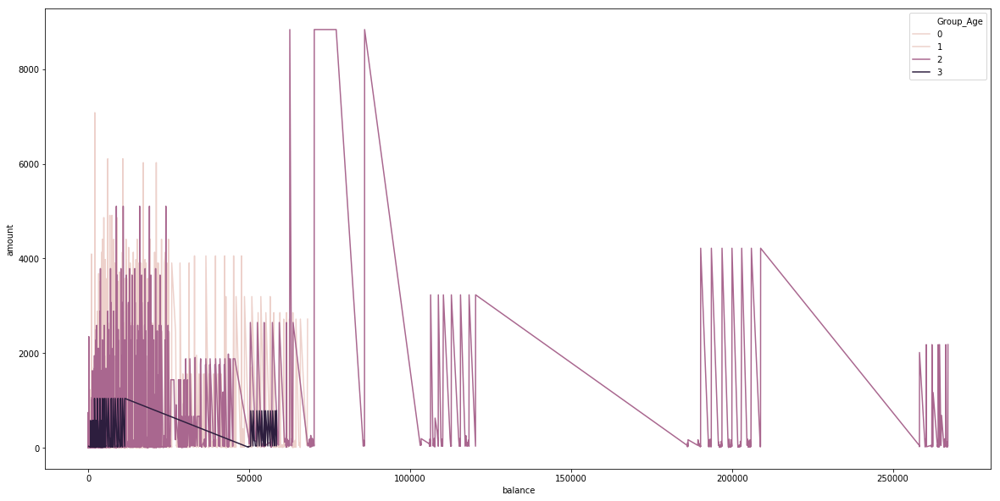

In [19]:
plt.figure(figsize=(20,10))
sns.lineplot(x='balance',y='amount',hue='Group_Age',data=data)
plt.show()

In [218]:
data.age.nunique()

33

In [219]:
data.age.unique()

array([26, 38, 40, 20, 43, 27, 19, 23, 30, 46, 47, 24, 37, 25, 21, 39, 31,
       34, 18, 78, 22, 42, 33, 28, 44, 69, 35, 41, 53, 64, 50, 52, 29],
      dtype=int64)

In [220]:
data.age.min()

18

In [221]:
data.age.max()

78

In [222]:
data.age.mean()

30.5823299842232